# Feature-level analysis

## Summary

This notebook contains code for the statistical analysis in the phase 1 feature-level analysis. In this phase, we investigated whether the radiomic features extracted from the original lesion and the rotated lesion were the same. If not, whether the differences or the value are statistically associated with the degree of rotation applied.

## Reference

Manuscript in preparation:

>    *Decoding the Rotation Effect: A Retrospective Study on Lesion Orientation and Wavelet Decomposition in Radiomics*

# Usage

See [README](./README.md)

In [1]:
import os
import sys
import re
import itertools
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns

import sklearn
from sklearn.feature_selection import VarianceThreshold
from sklearn.preprocessing import StandardScaler
from pathlib import Path
from IPython.display import *

# cd to current file to make sure relative path works
# os.chdir('/media/storage/Source/Repos/wavelet_analysis/src')
sys.path.append(Path('.').absolute().__str__())

# Add custom package
from feature_robustness_analysis.io import *
from feature_robustness_analysis.stats import *
from feature_robustness_analysis.plots import *

# basic configurations
mpl.style.use('ggplot')
mdprint = lambda x: display(Markdown(x))

# print versions
versions = {
    'sklearn': sklearn.__version__, 
    'pandas': pd.__version__,
}
print(versions)


{'sklearn': '1.4.1.post1', 'pandas': '2.2.2'}


# Loading the data

The extracted radiomic features were stored in a HDF5 database created using `pandas`. The features are stored as a table with size `(n_gtv, n_features)`.

In [2]:
# Load data
data_file_name = "../data/RadFeatures_raw_fine_res.h5"
try:
    df_raw = pd.read_hdf(data_file_name, index_col=0, header=[0, 1, 2])
    display(df_raw)
except FileNotFoundError:
    df_raw = pd.read_excel(data_file_name.replace('.h5', '.xlsx'), index_col=0, header=[0, 1, 2])
    # Save it as hdf5 for better read write speed
    df_raw.to_hdf(data_file_name, key="main")

Pre-processing diagnostics                                      \
Feature_Group     Versions                                       
Feature_Name   PyRadiomics   Numpy SimpleITK PyWavelet  Python   
Study number                                                     
LUNG1-001_R0        v3.1.0  1.24.3     2.2.1     1.4.1  3.8.16   
LUNG1-001_R10       v3.1.0  1.24.3     2.2.1     1.4.1  3.8.16   
LUNG1-001_R15       v3.1.0  1.24.3     2.2.1     1.4.1  3.8.16   
LUNG1-001_R20       v3.1.0  1.24.3     2.2.1     1.4.1  3.8.16   
LUNG1-001_R25       v3.1.0  1.24.3     2.2.1     1.4.1  3.8.16   
...                    ...     ...       ...       ...     ...   
LUNG1-422_R60       v3.1.0  1.24.3     2.2.1     1.4.1  3.8.16   
LUNG1-422_R65       v3.1.0  1.24.3     2.2.1     1.4.1  3.8.16   
LUNG1-422_R70       v3.1.0  1.24.3     2.2.1     1.4.1  3.8.16   
LUNG1-422_R75       v3.1.0  1.24.3     2.2.1     1.4.1  3.8.16   
LUNG1-422_R80       v3.1.0  1.24.3     2.2.1     1.4.1  3.8.16   

Pre-processing                                                     \
Feature_Group                                       Configuration   
Feature_Name                                             Settings   
Study number                                                        
LUNG1-001_R0    {'minimumROIDimensions': 2, 'minimumROISize': ...   
LUNG1-001_R10   {'minimumROIDimensions': 2, 'minimumROISize': ...   
LUNG1-001_R15   {'minimumROIDimensions': 2, 'minimumROISize': ...   
LUNG1-001_R20   {'minimumROIDimensions': 2, 'minimumROISize': ...   
LUNG1-001_R25   {'minimumROIDimensions': 2, 'minimumROISize': ...   
...                                                           ...   
LUNG1-422_R60   {'minimumROIDimensions': 2, 'minimumROISize': ...   
LUNG1-422_R65   {'minimumROIDimensions': 2, 'minimumROISize': ...   
LUNG1-422_R70   {'minimumROIDimensions': 2, 'minimumROISize': ...   
LUNG1-422_R75   {'minimumROIDimensions': 2, 'minimumROISize': ...   
LUNG1-422_R80   {'minimumROIDimensions': 2, 'minimumROISize': ...   

Pre-processing                                                     \
Feature_Group                                                       
Feature_Name                                    EnabledImageTypes   
Study number                                                        
LUNG1-001_R0    {'Original': {}, 'LBP3D': {'lbp3DIcosphereRadi...   
LUNG1-001_R10   {'Original': {}, 'LBP3D': {'lbp3DIcosphereRadi...   
LUNG1-001_R15   {'Original': {}, 'LBP3D': {'lbp3DIcosphereRadi...   
LUNG1-001_R20   {'Original': {}, 'LBP3D': {'lbp3DIcosphereRadi...   
LUNG1-001_R25   {'Original': {}, 'LBP3D': {'lbp3DIcosphereRadi...   
...                                                           ...   
LUNG1-422_R60   {'Original': {}, 'LBP3D': {'lbp3DIcosphereRadi...   
LUNG1-422_R65   {'Original': {}, 'LBP3D': {'lbp3DIcosphereRadi...   
LUNG1-422_R70   {'Original': {}, 'LBP3D': {'lbp3DIcosphereRadi...   
LUNG1-422_R75   {'Original': {}, 'LBP3D': {'lbp3DIcosphereRadi...   
LUNG1-422_R80   {'Original': {}, 'LBP3D': {'lbp3DIcosphereRadi...   

Pre-processing                                                           \
Feature_Group                             Image-original                  
Feature_Name                                        Hash Dimensionality   
Study number                                                              
LUNG1-001_R0    39ea04674e9fea67c0f2f98dac72cd3dbc64e205             3D   
LUNG1-001_R10   6f61a532d94986a210fd2d2c4eff08e8c449b6d9             3D   
LUNG1-001_R15   31c7436fa092f9004da1767b491cc594273468cd             3D   
LUNG1-001_R20   d4575e0ec96e06a41af9de18f4ccdf0c4b135e00             3D   
LUNG1-001_R25   785751af21a633d1964f677315aa5038194a471e             3D   
...                                                  ...            ...   
LUNG1-422_R60   abdcf75c988114891b4ded960cfa2a0c4f7574c1             3D   
LUNG1-422_R65   6bce3ff88d28d5f557a3fd8d1a5caf0e87cc0c9e             3D   
LUNG1-422_R70   33a1b923dd9b4723956fd

In [6]:
def standardize_df(df: pd.DataFrame):
    r"""Standardize dataframe by changing the column and index"""
    ori_index = df.index
    ori_col = df.columns
    # regpat for columns
    regpat = "(?P<PID>LUNG1-\d+)-?(?P<LESSION_CODE>\w?)_(?P<ROT_DEG>R\d+)"    
    for s in ori_col:
        try:
            "{PID},{LESSION_CODE},{ROT_DEG}".format(**re.search(regpat, s).groupdict()).split(',')
        except:
            print(s)
        
    # Define new list 
    new_column = pd.MultiIndex.from_tuples(
        ["{PID},{LESSION_CODE},{ROT_DEG}".format(**re.search(regpat, s).groupdict()).split(',') for s in ori_col], 
        names=["PID", "LessionCode", "Rotation"]
    )
    # Define new index
    if not isinstance(ori_index, pd.MultiIndex):
        new_index = pd.MultiIndex.from_tuples(
            [s.split("_") for s in ori_index], 
            names=["ImagingFilter", "Category", "Name"]
        )
    else: 
        new_index = ori_index
    new_index.names = ["ImagingFilter", "Category", "Name"]
    new_df = df.copy()
    new_df.index = new_index
    new_df.columns = new_column
    return new_df

# Replace R5 as R05 because of sorting issue
df_raw.index = [re.sub("R5$", 'R05', s) for s in df_raw.index]
df_raw.index = [re.sub("R0$", 'R00', s) for s in df_raw.index]
df_raw.to_hdf(data_file_name, key="main")
# display(df_raw)

df = standardize_df(df_raw.T)
df.sort_index(axis=0, inplace=True)
df.sort_index(axis=1, inplace=True)

# discard diagnostics which are not used for radiomics 
df.drop('diagnostics', axis=0, inplace=True)
mdprint("# Standardized Dataframe")
display(df)

# Drop excluded
df.drop(['LUNG1-245', 'LUNG1-019'], axis=1, inplace=True)

# Number of rotations
unique_rotations = df.columns.get_level_values('Rotation').unique()


# Standardized Dataframe

PID                                              LUNG1-001                  
LessionCode                                                                 
Rotation                                               R00            R05   
ImagingFilter Category   Name                                               
exponential   firstorder 10Percentile             0.845402       0.846459  \
                         90Percentile             1.217135       1.216774   
                         Energy              207278.584093  206989.601842   
                         Entropy                  0.721847       0.720305   
                         InterquartileRange       0.091773       0.091285   
...                                                    ...            ...   
wavelet-LLL   ngtdm      Busyness                12.206095      12.122981   
                         Coarseness               0.000074       0.000074   
                         Complexity             268.600376     268.486217   
                         Contrast                 0.007902       0.007801   
                         Strength                 0.105865       0.108623   

PID                                                                         
LessionCode                                                                 
Rotation                                               R10            R15   
ImagingFilter Category   Name                                               
exponential   firstorder 10Percentile             0.846659       0.845255  \
                         90Percentile             1.218058       1.217956   
                         Energy              207214.460545  207320.315036   
                         Entropy                  0.721132       0.722075   
                         InterquartileRange       0.091441       0.091546   
...                                                    ...            ...   
wavelet-LLL   ngtdm      Busyness                12.084919      12.210817   
                         Coarseness               0.000075       0.000074   
                         Complexity             266.508771     267.322944   
                         Contrast                  0.00778       0.007823   
                         Strength                 0.106865       0.106528   

PID                                                                         
LessionCode                                                                 
Rotation                                               R20            R25   
ImagingFilter Category   Name                                               
exponential   firstorder 10Percentile             0.846421       0.847258  \
                         90Percentile             1.216305       1.215841   
                         Energy              206926.752697  206813.382665   
                         Entropy                  0.719982       0.720081   
                         InterquartileRange       0.091008       0.090921   
...                                                    ...            ...   
wavelet-LLL   ngtdm      Busyness                12.106545      13.302507   
                         Coarseness               0.000075       0.000074   
                         Complexity             269.083699     254.001143   
                         Contrast                 0.007841       0.008292   
                         Strength                 0.108387       0.098354   

PID                                                                         
LessionCode                                                                 
Rotation                                               R30            R35   
ImagingFilter Category   Name                                               
exponential   firstorder 10Percentile             0.847848        0.84756  \
                         90Percentile             1.216766       1.215064   
                         Energy              206966.821053  206595.382

# Perform feature standardization

Also known as harmonization/normalization of feature values. The goal is to eliminate the systematic differences arising from different data preparation steps (batch effect). 

In [7]:
normalizer = StandardScaler()
normed_feats = normalizer.fit_transform(df.T)
df_normed = pd.DataFrame(normed_feats.T, index = df.index, columns = df.columns)
display(df_normed)
display(pd.concat([df_normed.mean(axis=1), df_normed.var(axis=1)], axis=1))

PID                                         LUNG1-001                       
LessionCode                                                                 
Rotation                                          R00       R05       R10   
ImagingFilter Category   Name                                               
exponential   firstorder 10Percentile       -0.185620 -0.180244 -0.179228  \
                         90Percentile       -0.374923 -0.379184 -0.364005   
                         Energy              0.810910  0.808836  0.810450   
                         Entropy             0.136455  0.131810  0.134299   
                         InterquartileRange -0.632120 -0.635835 -0.634648   
...                                               ...       ...       ...   
wavelet-LLL   ngtdm      Busyness            0.372716  0.365301  0.361905   
                         Coarseness         -0.329850 -0.329806 -0.329784   
                         Complexity          1.202926  1.202008  1.186097   
                         Contrast           -0.644493 -0.647360 -0.647942   
                         Strength           -0.464465 -0.461102 -0.463246   

PID                                                                         
LessionCode                                                                 
Rotation                                          R15       R20       R25   
ImagingFilter Category   Name                                               
exponential   firstorder 10Percentile       -0.186364 -0.180440 -0.176183  \
                         90Percentile       -0.365209 -0.384731 -0.390219   
                         Energy              0.811210  0.808384  0.807570   
                         Entropy             0.137142  0.130837  0.131134   
                         InterquartileRange -0.633851 -0.637947 -0.638615   
...                                               ...       ...       ...   
wavelet-LLL   ngtdm      Busyness            0.373138  0.363834  0.470539   
                         Coarseness         -0.329857 -0.329794 -0.329843   
                         Complexity          1.192648  1.206815  1.085457   
                         Contrast           -0.646725 -0.646211 -0.633402   
                         Strength           -0.463656 -0.461391 -0.473620   

PID                                                                         
LessionCode                                                                 
Rotation                                          R30       R35       R40   
ImagingFilter Category   Name                                               
exponential   firstorder 10Percentile       -0.173184 -0.174649 -0.175630  \
                         90Percentile       -0.379281 -0.399408 -0.376617   
                         Energy              0.808672  0.806005  0.809216   
                         Entropy             0.136302  0.126339  0.130033   
                         InterquartileRange -0.637229 -0.644384 -0.635795   
...                                               ...       ...       ...   
wavelet-LLL   ngtdm      Busyness            0.366725  0.408403  0.366082   
                         Coarseness         -0.329814 -0.329850 -0.329812   
                         Complexity          1.189135  1.078580  1.198833   
                         Contrast           -0.647022 -0.633415 -0.647154   
                         Strength           -0.463431 -0.470200 -0.462417   

PID                                                    ... LUNG1-422   
LessionCode                                            ...             
Rotation                                          R45  ...       R35   
ImagingFilter Category   Name                          ...             
exponential   firstorder 10Percentile       -0.180126  ... -0.297399  \
                         90Percentile       -0.376318  ...  0.496572   
                         Energy              0.809339  ... -0.383806   
                         Ent

0         1
ImagingFilter Category   Name                                      
exponential   firstorder 10Percentile       -2.305176e-15  1.000127
                         90Percentile       -5.371989e-14  1.000127
                         Energy             -1.016987e-16  1.000127
                         Entropy             1.987544e-15  1.000127
                         InterquartileRange -3.209131e-15  1.000127
...                                                   ...       ...
wavelet-LLL   ngtdm      Busyness           -1.775990e-16  1.000127
                         Coarseness          2.791779e-16  1.000127
                         Complexity          3.446191e-16  1.000127
                         Contrast           -9.364254e-16  1.000127
                         Strength            1.259188e-15  1.000127

[1688 rows x 2 columns]

# Sanity check

## What are the effects of the rotations on shape features?

The process of rotating an input image is computationally achieved by manipulating the digital grid that forms the image. This involves adjusting the grid's orientation and subsequently determining the values of the voxels, the volumetric pixels, in the newly arranged grid. This calculation is based on the known values from the grid's original layout. However, this computational procedure requires interpolation that will introduce error due to the partial volume effect and inturn manifested as deviations in the shape features of the segmented object.

The following code access extent of these alterations by calculating the percentage differences of each shape features extracted from the original ($R_0$) and rotated ($R_{05} \text{ to } R_{80}$) segmentation. These features should ideally remain constant irrespective of the orientation of the object in the digital space, but are inevitably affected in reality by resampling process.

In [8]:
# Analyse shape features deviations before and after rotaions
df_shape = df_normed.loc['original', 'shape'].copy()
df_shape = df_shape.T.drop_duplicates(ignore_index=False, inplace=False, keep='last').T

def pct_change_with_R0(x: pd.DataFrame) -> pd.DataFrame:
    r"""This function calculates the percentage change between columns in a given DataFrame, 
    using the formula (b - a) / (a + 1E-14). It takes the first column as a reference and 
    calculates the percentage change for all other columns relative to it. The resulting 
    DataFrame has the same column names as the input DataFrame, except for the first column. 
    If any errors occur during the calculation, the function returns a copy of the input 
    DataFrame with all values set to missing (NA).
    
    Args:
        x (pd.DataFrame): Input data frame to be normalized
    
    Returns:
        pd.DataFrame: The standardized dataframe with multi-index column and index.
    
    """
    # display(x.columns)
    pairs = itertools.product([x.columns[0]], x.columns[1:])
    try:
        out_x = pd.concat([(x[b] - x[a]) / (x[a] + 1E-14) for a, b in pairs], axis=1)
            
        # reconstruct column names
        out_x.columns = x.columns[1:]
        out_x.columns = out_x.columns.droplevel([0, 1])
        out_x.columns.names = x.columns.names[2:]
    except:
        out_x = x.copy()
        out_x.iloc[:, :] = pd.NA
        out_x.columns = out_x.columns.droplevel([0, 1])
    return out_x

df_shape = df.loc['original', 'shape'].copy()
# Make sure there's no duplicates 
df_shape = df_shape.T.drop_duplicates(ignore_index=False, inplace=False, keep='last').T
df_shape.index = pd.MultiIndex.from_tuples([('original', 'shape', i) for i in df_shape.index], names=df.index.names)
display(df_shape)

# Also calculate the trend
trend_df = identify_trend_from_df(df)
sig_trend = trend_df.index[(trend_df['pval'] < .05) & (trend_df['cor'] >= 0.1)] 

PID                                                 LUNG1-001                  
LessionCode                                                                    
Rotation                                                  R00            R05   
ImagingFilter Category Name                                                    
original      shape    Elongation                    0.727227       0.726972  \
                       Flatness                      0.545216       0.544997   
                       LeastAxisLength              45.743563      45.680083   
                       MajorAxisLength              83.899907      83.817069   
                       Maximum2DDiameterColumn      93.932927      93.831345   
                       Maximum2DDiameterRow          78.88425       78.14941   
                       Maximum2DDiameterSlice       94.074958      94.363431   
                       Maximum3DDiameter            94.343216      94.524995   
                       MeshVolume               154606.221865  154295.586981   
                       MinorAxisLength              61.014293      60.932629   
                       Sphericity                    0.685878       0.695059   
                       SurfaceArea               20310.569119   20015.435176   
                       SurfaceVolumeRatio             0.13137       0.129721   
                       VoxelVolume              154692.679644  154383.480549   

PID                                                                            
LessionCode                                                                    
Rotation                                                  R10            R15   
ImagingFilter Category Name                                                    
original      shape    Elongation                    0.727191       0.726599  \
                       Flatness                      0.544209       0.544994   
                       LeastAxisLength              45.623419      45.692782   
                       MajorAxisLength              83.834408      83.840833   
                       Maximum2DDiameterColumn       91.57324      93.998896   
                       Maximum2DDiameterRow         72.981306      80.416824   
                       Maximum2DDiameterSlice        94.80707      94.074958   
                       Maximum3DDiameter            94.932725      94.120565   
                       MeshVolume               154215.260409  154347.003748   
                       MinorAxisLength              60.963607      60.918667   
                       Sphericity                     0.70182       0.697151   
                       SurfaceArea               19815.715691   19959.781321   
                       SurfaceVolumeRatio            0.128494       0.129318   
                       VoxelVolume               154336.91442  154446.810484   

PID                                                                            
LessionCode                                                                    
Rotation                                                  R20            R25   
ImagingFilter Category Name                                                    
original      shape    Elongation                    0.727014       0.727373  \
                       Flatness                      0.544926       0.545092   
                       LeastAxisLength              45.679115      45.680463   
                       MajorAxisLength              83.826295      83.803233   
                       Maximum2DDiameterColumn      88.915466      92.216668   
                       Maximum2DDiameterRow         73.528088      84.938485   
                       Maximum2DDiameterSlice       94.343216      91.739718   
                       Maximum3DDiameter               94.419      94.887508   
                       MeshVolume               154356.200558  154341.881474   
                       MinorAxisLength              60.942881      60.956171  

## Summary of percentage changes

Median        LQ        HQ
ImagingFilter Category Name        Rotation                              
original      shape    Elongation  R05      -0.000244 -0.001828  0.001406
                                   R10      -0.000162 -0.001431  0.001216
                                   R15      -0.000075 -0.001318  0.000999
                                   R20      -0.000032 -0.001193  0.001024
                                   R25      -0.000044 -0.001214  0.000935
...                                               ...       ...       ...
                       VoxelVolume R60      -0.004848 -0.010748 -0.002273
                                   R65      -0.004940 -0.010689 -0.002117
                                   R70      -0.004613 -0.010841 -0.002254
                                   R75      -0.004526 -0.010531 -0.002093
                                   R80      -0.004740 -0.010606 -0.002090

[224 rows x 3 columns]

cor      pval
original Elongation               0.000018  0.998707
         Flatness                -0.000308  0.978215
         LeastAxisLength         -0.000851  0.939796
         MajorAxisLength         -0.000751  0.946884
         Maximum2DDiameterColumn -0.024818  0.027681
         Maximum2DDiameterRow    -0.007888  0.484092
         Maximum2DDiameterSlice   0.023974  0.033430
         Maximum3DDiameter       -0.000798  0.943571
         MeshVolume              -0.000833  0.941075
         MinorAxisLength         -0.000717  0.949281
         Sphericity              -0.020018  0.075760
         SurfaceArea              0.001438  0.898492
         SurfaceVolumeRatio       0.004270  0.704877
         VoxelVolume             -0.000597  0.957740

## Spearman's test

cor      pval
exponential firstorder 10Percentile        0.001666  0.882492
                       90Percentile       -0.000476  0.966351
                       Energy             -0.000396  0.971979
                       Entropy            -0.001411  0.900362
                       InterquartileRange -0.001983  0.860365
...                                             ...       ...
wavelet-LLL ngtdm      Busyness           -0.000508  0.964039
                       Coarseness          0.000590  0.958262
                       Complexity         -0.001460  0.896989
                       Contrast           -0.001308  0.907649
                       Strength            0.000946  0.933111

[1688 rows x 2 columns]

## Plots of percentage differences

[]

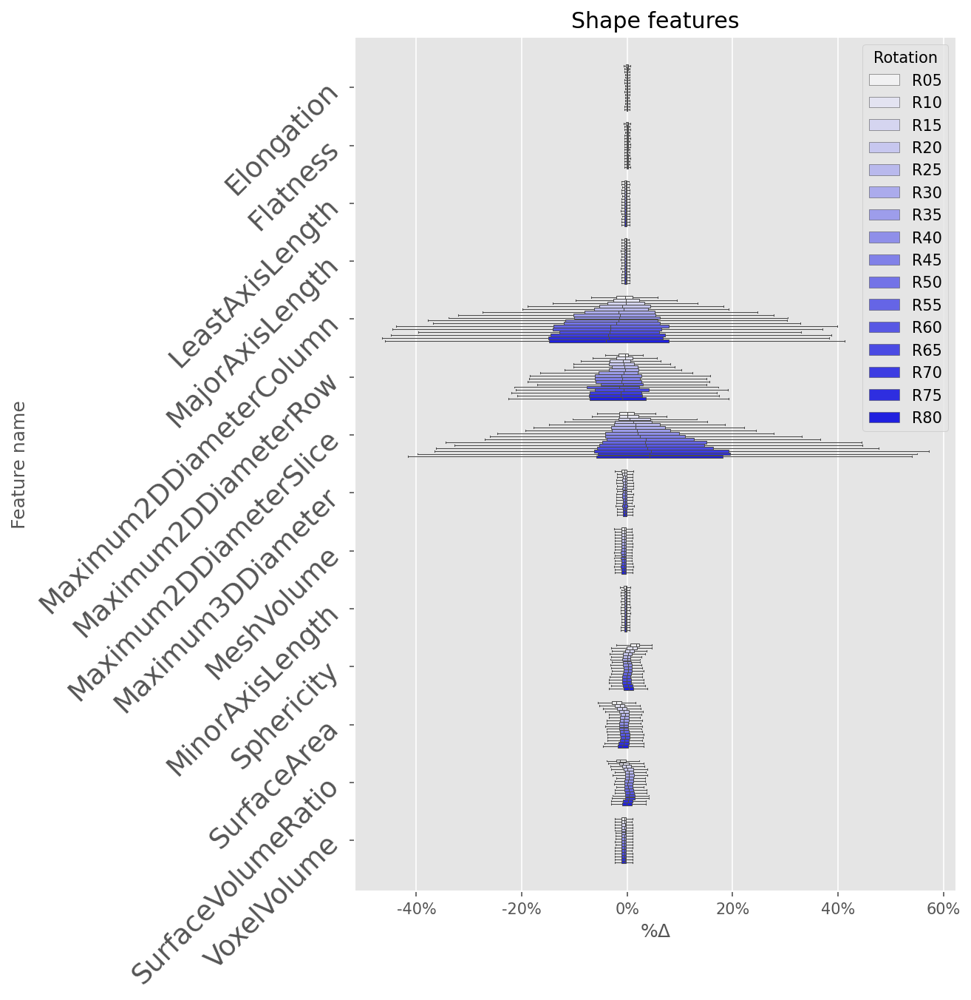

In [9]:

# For each shape feature, display the histogram of percentage error
fig, ax = plt.subplots(1, 1, figsize=(7, 10), sharex=False, dpi=150)
_, shape_summary = plot_percentage_difference(df_shape, ax=ax, title = "Shape features", linewidth=0.5, color='blue')

mdprint("## Summary of percentage changes")
display(shape_summary)
display(trend_df.xs('shape', level=1))

mdprint("## Spearman's test")
display(trend_df)
trend_df.to_excel("Spearmans_20231009.xlsx")

mdprint("## Plots of percentage differences")
plt.plot()


## Interpretation of the boxplot

Here we can see most, 11 out of 14, shape features are pretty stable across all rotations (note that we didn't show $R_{10}, R_{20}, ...$ simply to avoid the graph being too crowded) except for three 2D diameter features. Now this is not very surprising because these three features were measured on the cross-section of the lesion along the x/y/z axis, and when the NSCLC gtv was rotated within the grid, the cross section naturally changes, resulting in a large % change in these three features. Therefore, we can safely say that the application of rotation did not affect the manual segmentation, and we will focus on the texture features hereon. 


## Affects on Texture features

Our manuscript focuses the investigation on texture features. The methodology is essentially same as what we did with the shape features. I.e., the % change of features of features extracted from the rotated GTV compared to those of the unrotated GTV were evaluated.

### Define some useful functions

In [10]:
def plot_percentage_difference(df: pd.DataFrame,
                               ax: Optional[plt.Axes] = None,
                               title: Optional[str] = None,
                               **kwargs) -> Tuple[plt.Axes, pd.DataFrame]:
    r"""Plot the percentage change between two columns in a DataFrame.

    This function asserts that the DataFrame and its index both have three levels. It calculates
    the percentage change with respect to the initial value and plots the data in a box plot.

    Args:
        df (pd.DataFrame):
            A pandas DataFrame with three levels in both columns and index.
        ax (Optional[plt.Axes], default=None):
            An optional Matplotlib Axes object to plot the graph on.
            If none is provided, a new Axes object will be created.
        title (Optional[str], default=None):
            An optional title for the plot.
        **kwargs:
            Additional keyword arguments to pass to seaborn's :func:`boxplot` function.

    Returns:
        plt.Axes:
            The Axes object with the plot drawn onto it.
        pd.DataFrame:
            A summary DataFrame with the mean and variance of percentage difference for each feature.

    Raises:
        AssertionError: If the DataFrame 'df' does not have three levels in its columns or index.
    """
    assert df.columns.nlevels == 3, "df must have 3 levels"
    assert df.index.nlevels == 3, "df index must have 3 levels"

    pct = df.groupby(axis=1, level=[0, 1]).apply(pct_change_with_R0)
    pct_melted = pct.reset_index().melt(id_vars=pct.index.names,
                                        var_name=df.columns.names).dropna()

    # Construct output summary of the percentage differences mean/var for each feature
    summary_out = pct_melted.copy()
    summary_out.set_index(df.index.names[0], drop=True, inplace=True)
    summary_out.set_index(df.index.names[1], drop=True, inplace=True, append=True)
    summary_out.set_index(df.index.names[2], drop=True, inplace=True, append=True)
    summary_out.set_index(df.columns.names[-1], drop=True, inplace=True, append=True)
    summary_out['value'] = summary_out['value'].astype('float')
    summary_out = pd.concat([summary_out.groupby(axis=0, level=[0, 1, 2, -1])['value'].median(),
                             summary_out.groupby(axis=0, level=[0, 1, 2, -1])['value'].quantile(0.25),
                             summary_out.groupby(axis=0, level=[0, 1, 2, -1])['value'].quantile(0.75)],
                            axis=1)
    summary_out.columns = ['Median', 'LQ', 'HQ']

    # Drop some rotation to get better visuals
    filter = [f'R{i:02d}' for i in range(10, 81, 10)]
    pct_melted['drop'] = pct_melted['Rotation'].apply(lambda x: x in filter)
    pct_melted = pct_melted[~pct_melted['drop']]

    # Creates the ax if its not provided
    if ax is None:
        figsize = kwargs.pop('figsize', (10, 7))
        fig, ax = plt.subplots(1, 1, figsize=figsize, sharex=False)

    # Generate box plot    
    sns.boxplot(pct_melted,
                y='Name', x='value', hue=df.columns.names[-1], showfliers=False, ax=ax, **kwargs)

    # Set up axes labels
    ax.set_ylabel("Feature name")
    ax.set_xlabel("%$\Delta$")

    # Limit xlim to -100% to 100%
    xlim = ax.get_xlim()
    ax.set_xlim(max(xlim[0], -1), min(xlim[1], 1))

    # Aesthetic settings for display
    ax.set_yticklabels(ax.get_yticklabels(), rotation=35, fontsize=12)
    ax.set_xticklabels([f"{a * 100:.0f}%" for a in ax.get_xticks()])
    if not title is None:
        ax.set_title(title)
    return ax, summary_out

## Boxplots for texture features

> Note that we collapsed the result from the next cell because its very long.
> It consist of roughly 15 plots corresponding to features extracted with different
> imaging filters. 

## exponential

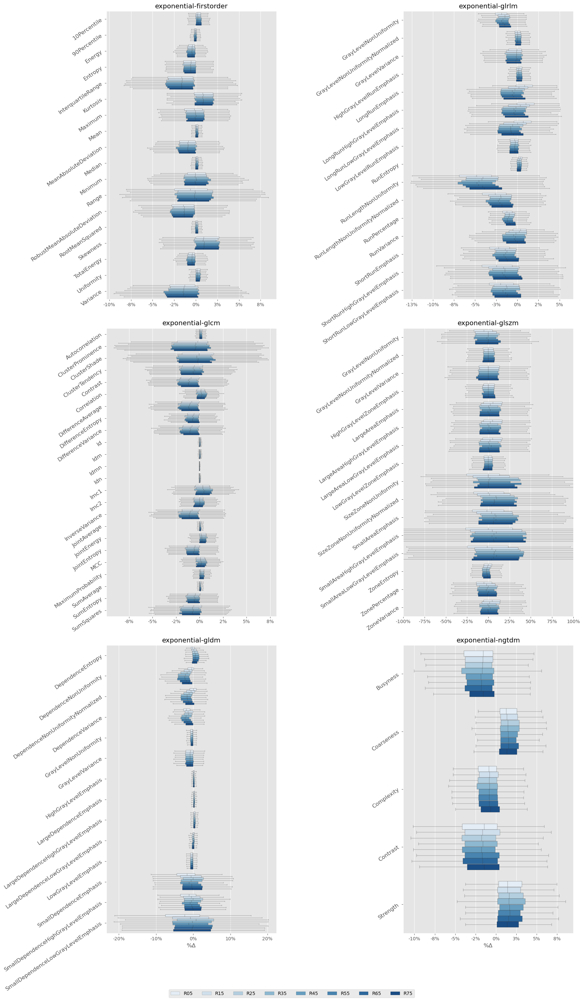

## gradient

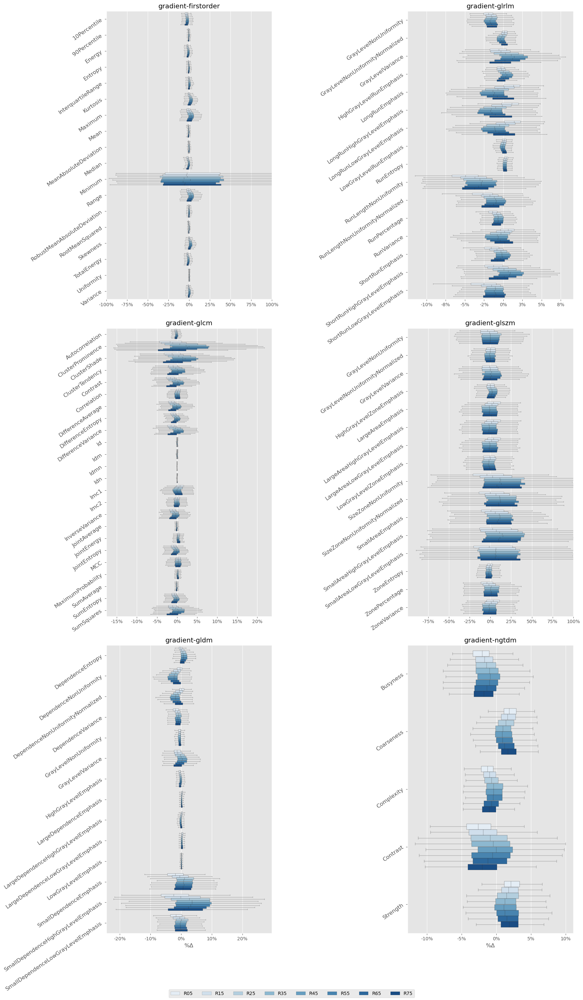

## lbp-3D-k

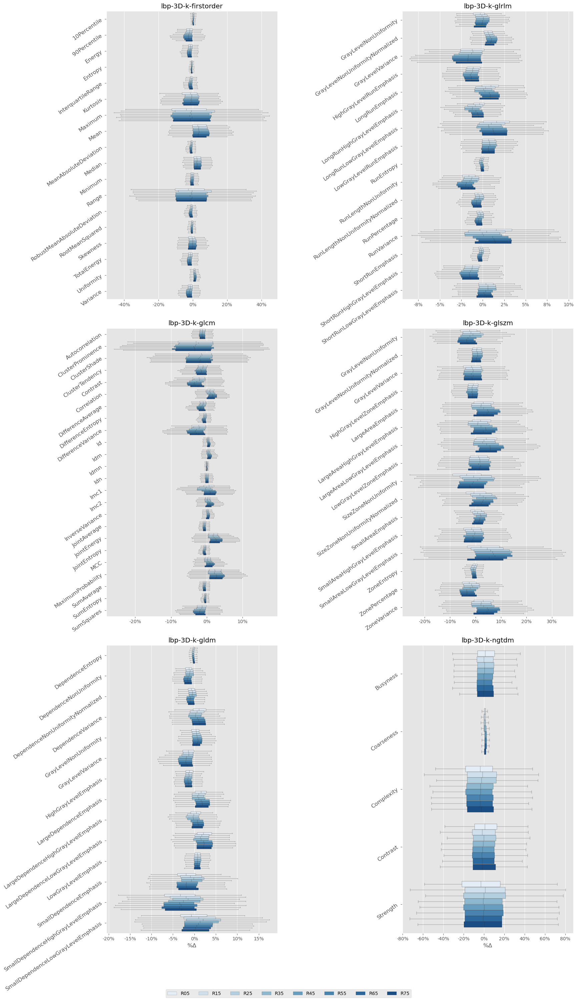

## lbp-3D-m1

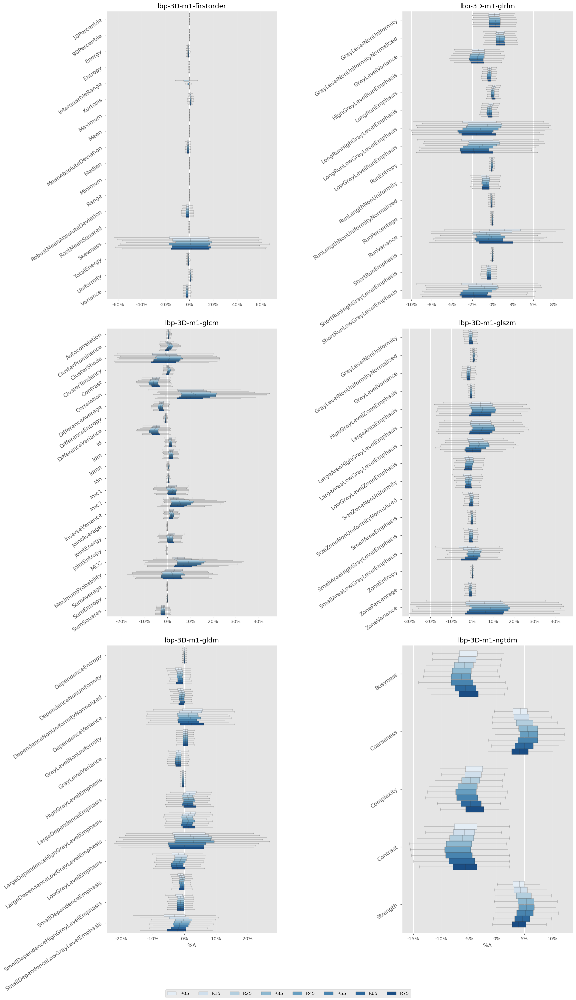

## lbp-3D-m2

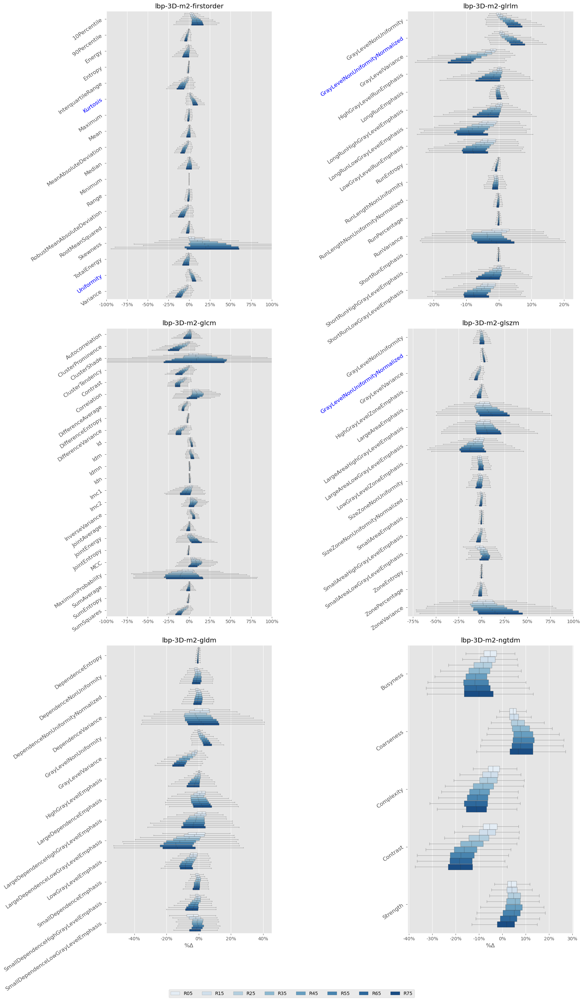

## log-sigma-0-9765625-mm-3D

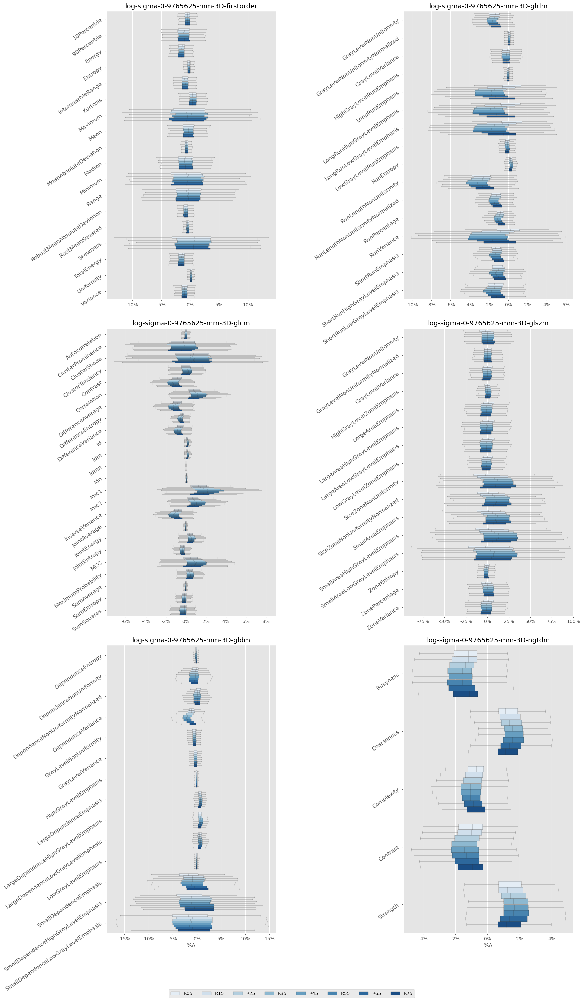

## logarithm

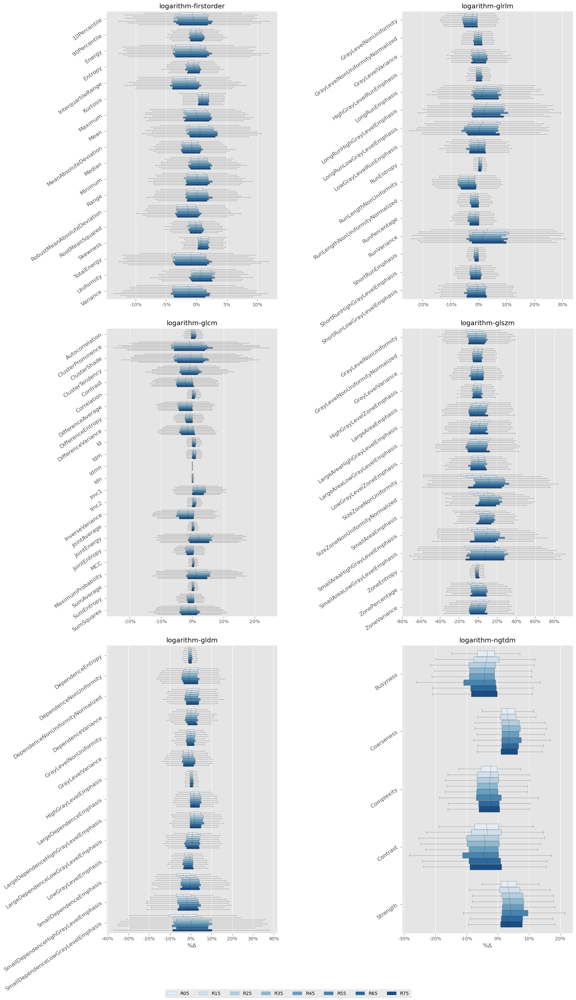

## original

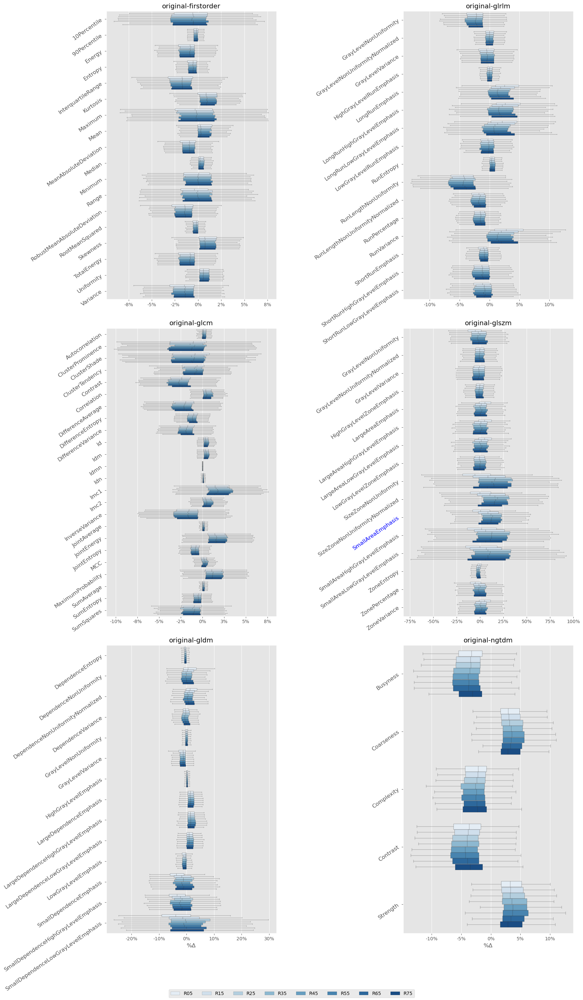

## square

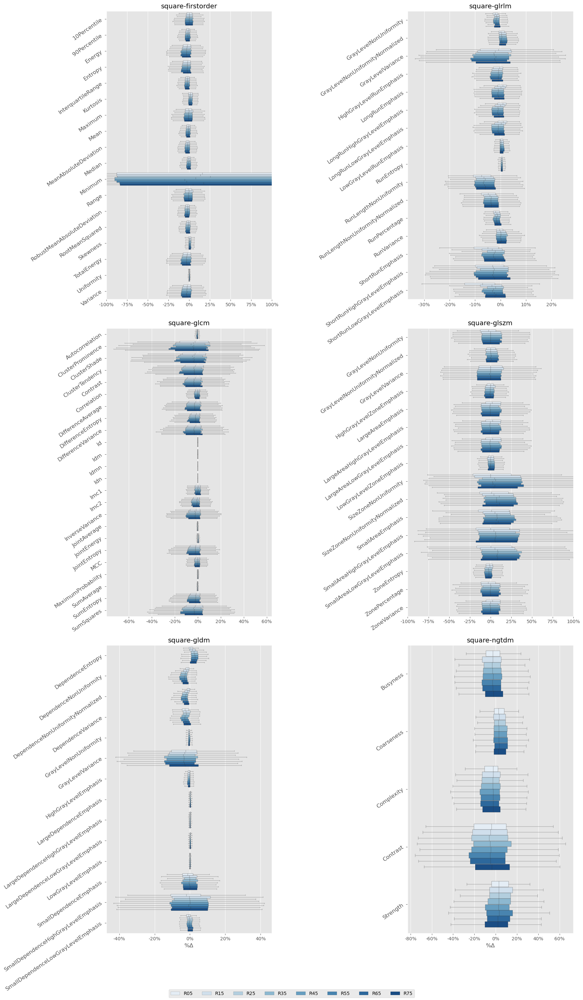

## squareroot

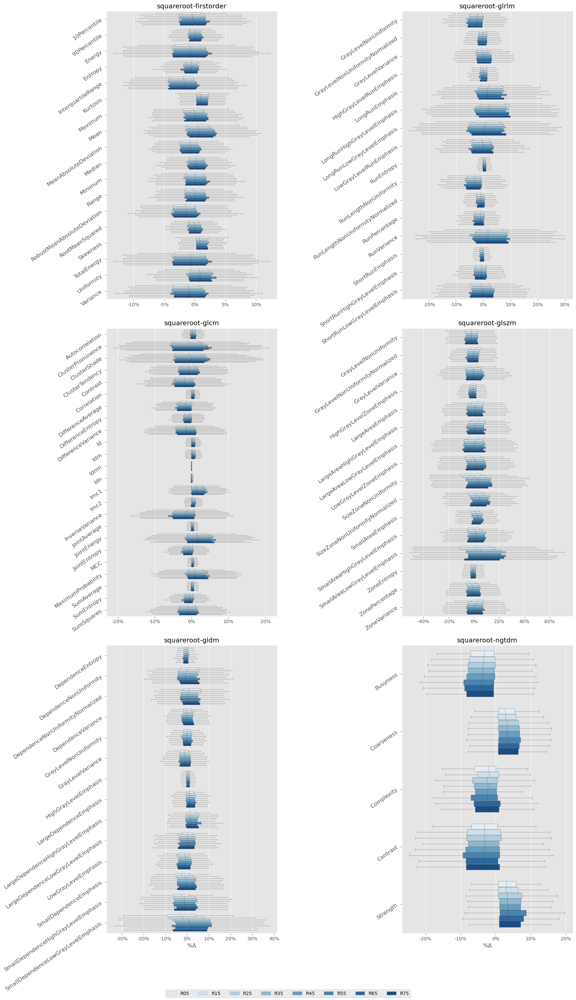

## wavelet-HHH

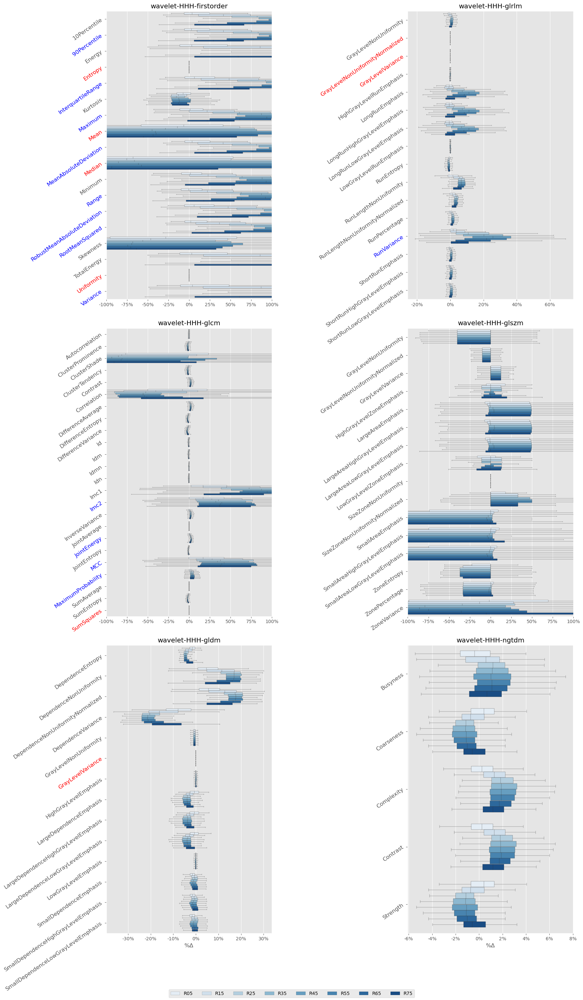

## wavelet-HHL

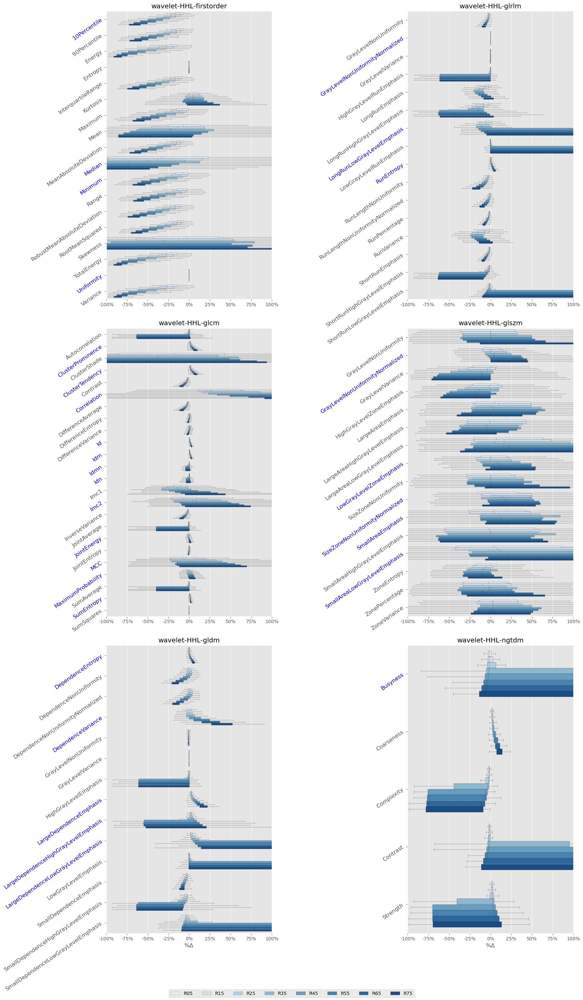

## wavelet-HLH

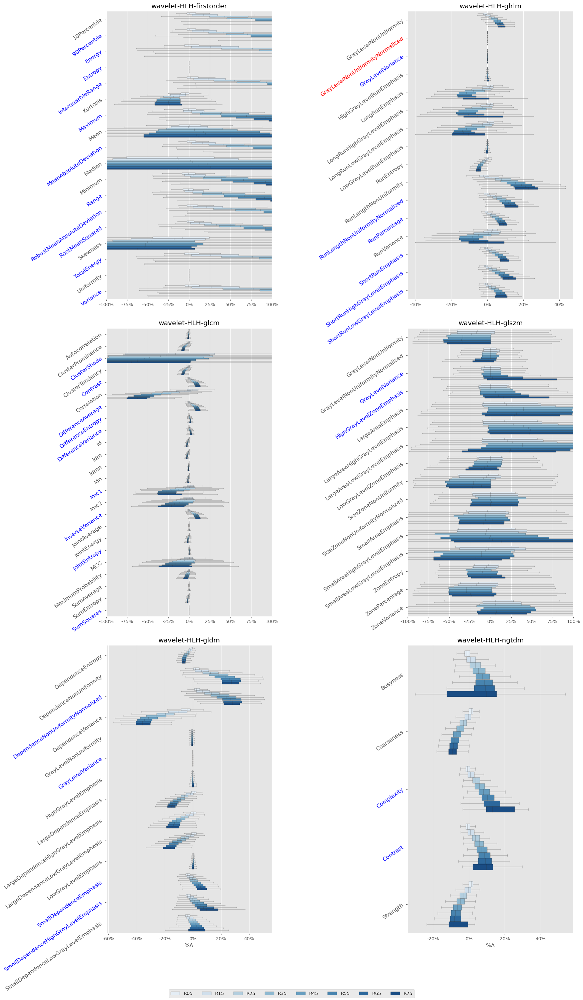

## wavelet-HLL

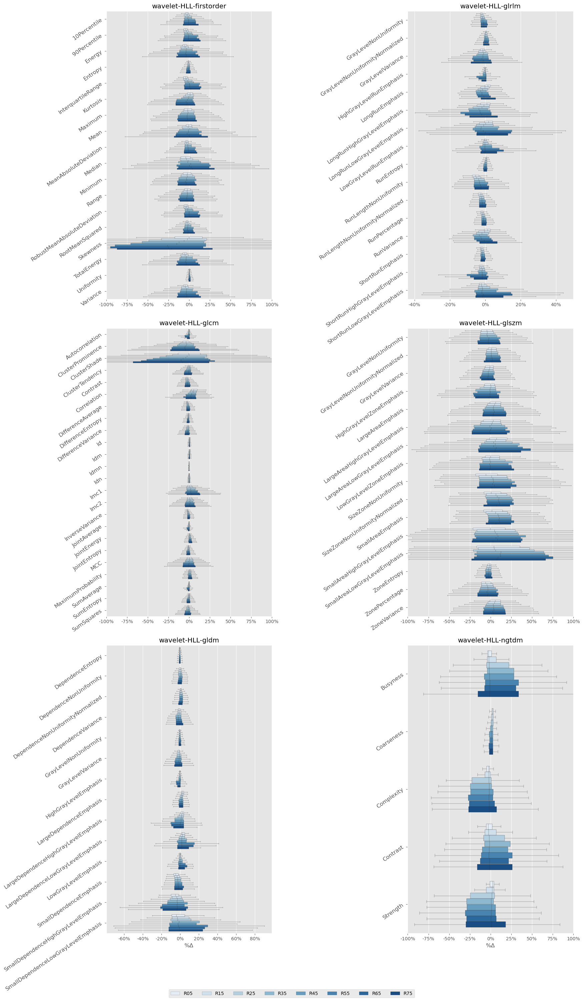

## wavelet-LHH

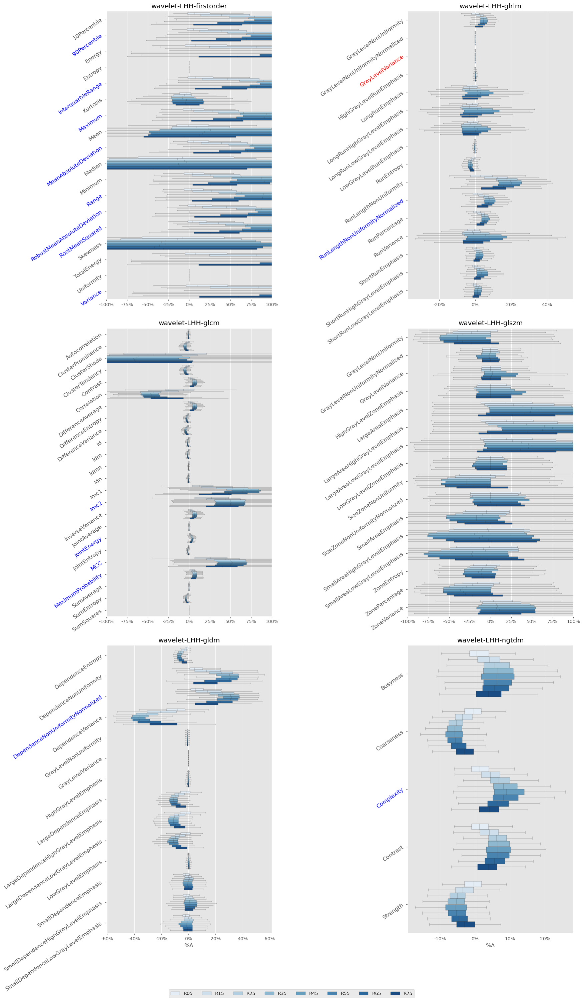

## wavelet-LHL

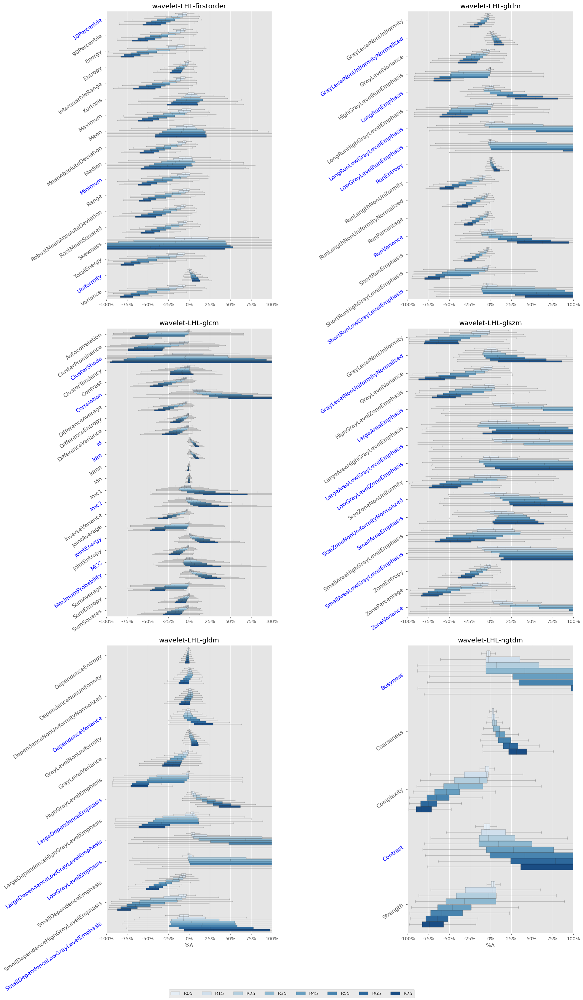

## wavelet-LLH

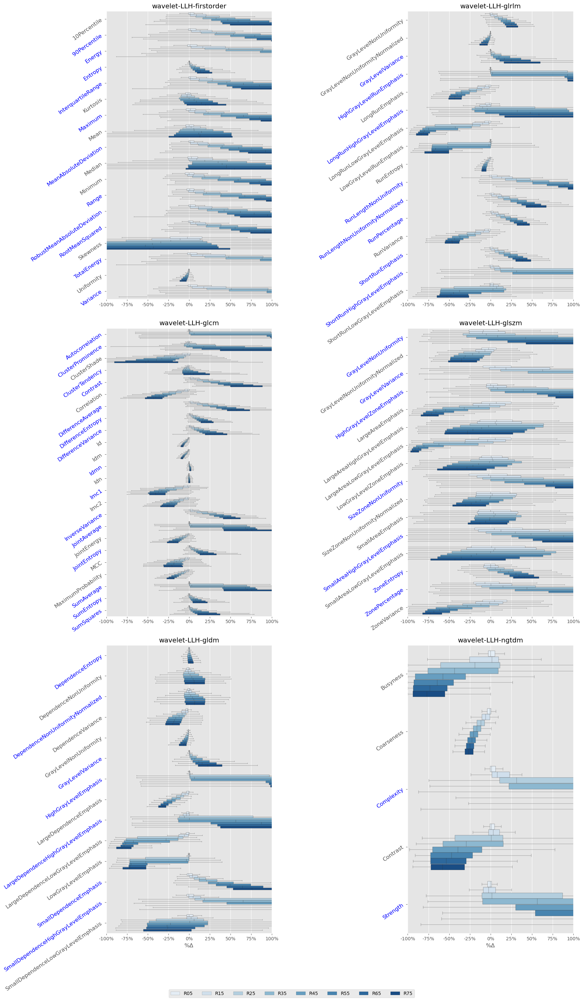

## wavelet-LLL

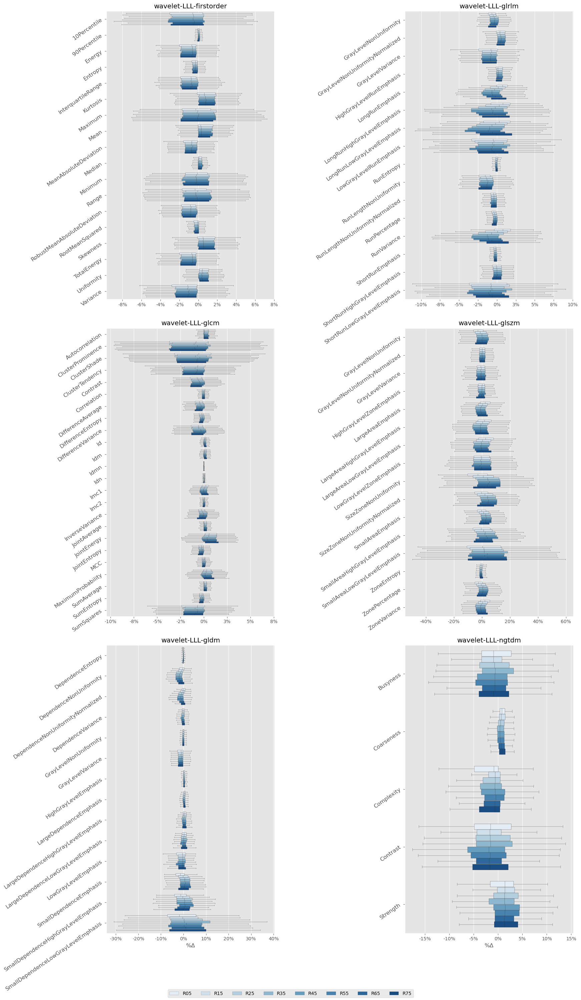

Median        LQ        HQ   
ImagingFilter Category   Name         Rotation                                 
exponential   firstorder 10Percentile R05       0.002338  0.000230  0.005974  \
                                      R10       0.002530  0.000518  0.006244   
                                      R15       0.002004  0.000096  0.005635   
                                      R20       0.002407  0.000157  0.006000   
                                      R25       0.002188  0.000195  0.005774   
...                                                  ...       ...       ...   
wavelet-LLL   ngtdm      Strength     R60       0.012910 -0.007715  0.041204   
                                      R65       0.012862 -0.006180  0.032484   
                                      R70       0.013592 -0.019325  0.037884   
                                      R75       0.013338 -0.007854  0.040743   
                                      R80       0.014356 -0.001089  0.039205   

                                                is_filtered_by_var_thres   
ImagingFilter Category   Name         Rotation                             
exponential   firstorder 10Percentile R05                          False  \
                                      R10                          False   
                                      R15                          False   
                                      R20                          False   
                                      R25                          False   
...                                                                  ...   
wavelet-LLL   ngtdm      Strength     R60                          False   
                                      R65                          False   
                                      R70                          False   
                                      R75                          False   
                                      R80                          False   

                                                is_spearmans_trend_significant  
ImagingFilter Category   Name         Rotation                                  
exponential   firstorder 10Percentile R05                                False  
                                      R10                                False  
                                      R15                                False  
                                      R20                                False  
                                      R25                                False  
...                                                                        ...  
wavelet-LLL   ngtdm      Strength     R60                                False  
                                      R65                                False  
                                      R70                                False  
                                      R75                                False  
                                      R80                                False  

[26784 rows x 5 columns]

In [11]:
summary_df = []
plt.close('all')
for wf in df.index.get_level_values(0).unique():
    mdprint(f"## {wf}")
    df_wf = df.loc[wf]
    feature_cat = df_wf.index.get_level_values(0).unique()
    
    # For each feature category
    fig, ax = plt.subplots(len(feature_cat) // 2, 2, figsize=(14, 30))
    for i, cat in enumerate(feature_cat):
        # Skip shape because its already analyzed
        if cat == 'shape': 
            continue

        # find out which features has zero variances
        var_thres = VarianceThreshold(threshold=1E-6)
        var_thres.fit(df_wf.loc[cat].T)
        v_low = df_wf.loc[cat].index[~var_thres.get_support()]
        display_df = df_wf.loc[cat].loc[v_low]

        # identify where to plot
        ax_y, ax_x = i % (len(feature_cat) // 2), i // (len(feature_cat) // 2)
        _ax: plt.Axes = ax[ax_y][ax_x]
        
        # reconstruct the index
        _df_cat = df_wf.loc[cat]
        _df_cat.index = pd.MultiIndex.from_tuples([(wf, cat, n) for n in _df_cat.index], names=df.index.names)
        
        # plot and calculate the percentage differences
        # Because there are too many bars, only show R05, R15, R25...
        _, _cat_summary = plot_percentage_difference(_df_cat, ax=_ax, title=f"{wf}-{cat}", linewidth=0.3, palette='Blues')
        
        _ax.legend().remove()
        _cat_summary['is_filtered_by_var_thres'] = [a in v_low for a in _cat_summary.index.get_level_values(2)]
        # note that _cat_summary has rotation as index level 4 
        _cat_summary['is_spearmans_trend_significant'] = [a[:3] in sig_trend for a in _cat_summary.index] 

        # reconstruct the labels with respect to their properties        
        yticklabels = _ax.get_yticklabels()
        for ylab in yticklabels:
            # highlight the ylabels that are marked with *
            _feat_name = ylab.get_text()
            if _feat_name in v_low:
                ylab.set_color("red")
                ylab.set_label(f"{ylab.get_text()}*")
            if (wf, cat, _feat_name) in sig_trend:
                ylab.set_color("blue")
                ylab.set_label(f"{ylab.get_text()}^")
        
        summary_df.append(_cat_summary)
        
        # Only show the x label for the last two diagrams
        _ax.set_ylabel(None)
        if ax_y != len(feature_cat) // 2 - 1:
            _ax.set_xlabel(None)
    
    # * Use last ax's legend and put it at the bottom.
    _lines, _labels = _ax.get_legend_handles_labels()
    fig.tight_layout()
    fig.subplots_adjust(left=0, right=1, hspace=0.1)
    fig.legend(_lines, _labels, loc='lower center', ncols=8)
    fig.savefig(f"img/{wf}.svg")
    plt.show()
summary_df = pd.concat(summary_df)
display(summary_df)

# Tables and Plots

Here are the code that was used to generate the tables adn plots in the figures in the manuscript.

In [12]:
import numpy as np
import scipy.stats

def mean_confidence_interval(data, confidence=0.95):
    a = 1.0 * np.array(data).astype('float')
    n = len(a)
    m, se = np.mean(a), scipy.stats.sem(a)
    h = se * scipy.stats.t.ppf((1 + confidence) / 2., n-1)
    out = pd.Series([m, m-h, m+h], index=['Mean', 'Lower', 'Upper'], name=f"{confidence * 100:.0f}% CI")
    return out

def get_CI_table(data: pd.DataFrame, group_levels: List):
    CI_table = data.groupby(level=group_levels).apply(mean_confidence_interval).reset_index(level=-1)
    CI_table = CI_table.pivot(
        columns=[CI_table.columns[0]]
    )

    # drop column levels for convinience
    CI_table = CI_table.T.reset_index(drop=True).T
    # note that the order is mixed because the transform re-sorted 'Mean', 'Lower', 'Upper' -> 'Lower', 'Mean', 'Upper'
    CI_out = CI_table.T.apply(lambda a: f"{a[1] * 100:.01f}% ({a[0] * 100:.01f}%-{a[2] * 100:.01f}%)").to_frame()
    return CI_out

def get_count_table(data: pd.DataFrame, group_levels: List):
    # Counts of features, // 4 because there are 4 rotations
    counting_var = data.groupby(level=group_levels)[['is_filtered_by_var_thres']].value_counts().to_frame() // (len(unique_rotations) - 1) # -1 because R00 is in unique rotation
    counting_spearmans = data.groupby(level=group_levels)[['is_spearmans_trend_significant']].value_counts().to_frame() // (len(unique_rotations) - 1)
    var_thres_count_col = counting_var.reset_index(level=-1).pivot(
        columns='is_filtered_by_var_thres', values='count'
    ).apply(
        lambda a: f"{a.fillna(0)[True] / float(a.fillna(0)[True] + a[False]) * 100:.02f}% ({int(a.fillna(0)[True]):d}/{int(a.fillna(0)[True] + a[False]):d})", 
        axis=1
    )
    spearmans_sig_count_col = counting_spearmans.reset_index(level=-1).pivot(
        columns='is_spearmans_trend_significant', values='count'
    ).apply(
        lambda a: f"{a.fillna(0)[True] / float(a.fillna(0)[True] + a[False]) * 100:.02f}% ({int(a.fillna(0)[True]):d}/{int(a.fillna(0)[True] + a[False]):d})", 
        axis=1
    ).to_frame()
    summary_display_df = pd.concat([var_thres_count_col, spearmans_sig_count_col], axis=1)
    summary_display_df.columns = ['Var Thres Filtered Out', 'Spearmans Filtered Out']
    return summary_display_df

# Calculate interquartile raage
summary_df_p = summary_df.copy()
summary_df_p['IQR'] = summary_df['HQ'] - summary_df['LQ']
# Separately consider wavelet features and non-wavelet features
summary_df_p['is_wavelet'] = [i.find("wavelet") >= 0 for i in summary_df_p.index.get_level_values(0)]
summary_df_p.set_index('is_wavelet', append=True, drop=True, inplace=True)
summary_grouped_by_category = summary_df_p.groupby(level=[-1, 1]).mean().applymap(lambda x: "{:.1%}".format(x))
summary_grouped_by_filter = summary_df_p.groupby(level=[-1, 0]).mean().applymap(lambda x: "{:.1%}".format(x))
# calculate 95% confidence intervals for median and IQR
filter_IQR_CI = get_CI_table(summary_df_p['IQR'], [-1, 0])
filter_IQR_CI.columns = ['IQR']
filter_Med_CI = get_CI_table(summary_df_p['Median'], [-1, 0])
filter_Med_CI.columns = ['Median']

category_IQR_CI = get_CI_table(summary_df_p['IQR'], [-1, 1])
category_IQR_CI.columns = ['IQR']
category_Med_CI = get_CI_table(summary_df_p['Median'], [-1, 1])
category_Med_CI.columns = ['Median']


mdprint("### Grouped by Imaging filter")
mdprint("#### IQR")
display(HTML(filter_IQR_CI.to_html()))
mdprint("#### Median")
display(HTML(filter_Med_CI.to_html()))
display(get_CI_table(summary_df_p['IQR'], [-1]))
filter_summary_display_df = get_count_table(summary_df_p, [-1, 0])
mdprint("#### Filtered out")
display(HTML(filter_summary_display_df.to_html()))

mdprint("### Grouped by category")
display(HTML(category_IQR_CI.to_html()))
display(HTML(category_Med_CI.to_html()))

category_summary_display_df = get_count_table(summary_df_p, [-1, 1])
display(HTML(category_summary_display_df.to_html()))

### Grouped by Imaging filter

#### IQR

#### Median

,0
is_wavelet,
False,7.3% (6.6%-7.9%)
True,34.0% (32.7%-35.4%)


#### Filtered out

### Grouped by category

### Heatmap plot

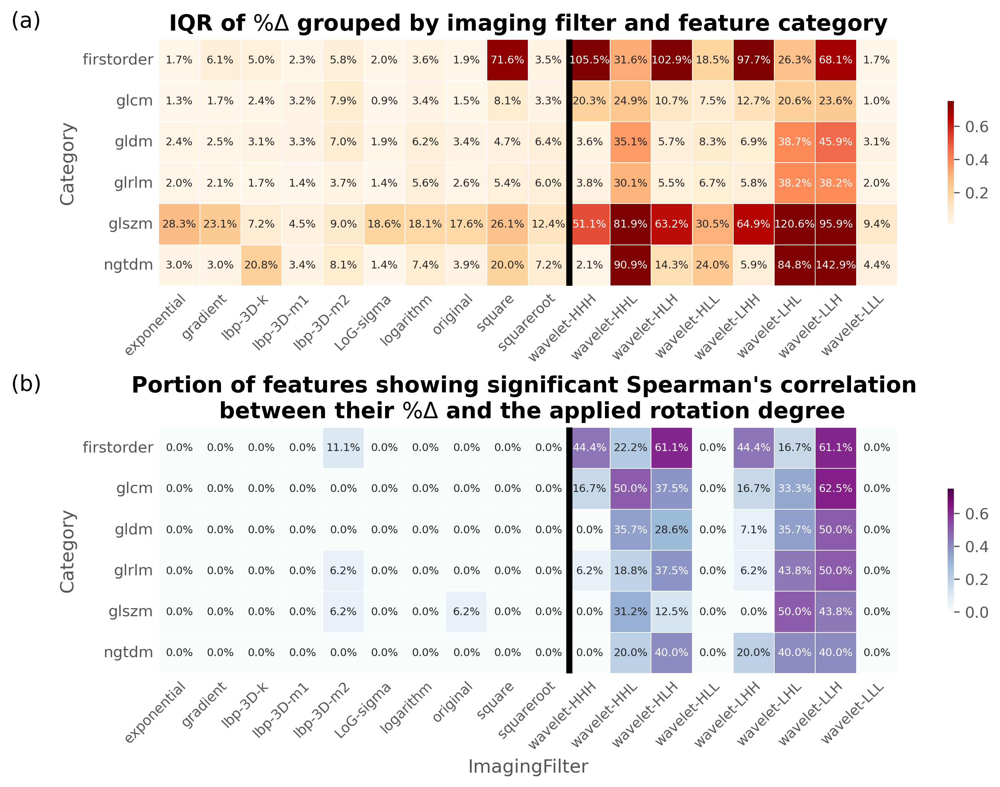

In [13]:
import re

# pivot the table for displaying a heat map for IQR
mdprint("### Heatmap plot")
heat_map = summary_df_p.reset_index().pivot(index="ImagingFilter", columns=["Category", "Name", "Rotation"], values="IQR").groupby(axis=1, level=0).mean()

log_re = r"log.*-mm-3D"
fig, ax = plt.subplots(2, 1, figsize=(10, 7), layout='constrained', dpi=300)
sns.heatmap(heat_map.T, vmax=.75, square=True, cmap='OrRd', cbar_kws={"shrink": .5}, annot=True, annot_kws={"fontsize": 7}, fmt='.1%', linewidths=0.1, ax=ax[0])
ax[0].set_yticklabels(ax[0].get_yticklabels(), rotation=0)
ax[0].set_title("IQR of $\%\Delta$ grouped by imaging filter and feature category", fontweight='bold')
ax[0].set_xticklabels([re.sub(log_re, 'LoG-sigma', a.get_text()).rstrip() for a in ax[0].get_xticklabels()], 
                      rotation=45, ha='right', fontsize=9, rotation_mode='anchor')
ax[0].set_xlabel(None)
ax[0].tick_params(axis='both', which='both', length=0)

# pivot the table for displaying a heat map for % of features that showed significant Spearman's test
heat_map = summary_df_p.reset_index().pivot(index="ImagingFilter", columns=["Category", "Name", "Rotation"], values="is_spearmans_trend_significant").groupby(axis=1, level=0).mean()

sns.heatmap(heat_map.T, vmax=.75, square=True, cmap='BuPu', cbar_kws={"shrink": .5, }, annot=True, annot_kws={"fontsize": 7}, fmt='.1%', linewidths=0.1, ax=ax[1])
ax[1].set_xticklabels([re.sub(log_re, 'LoG-sigma', a.get_text()) for a in ax[1].get_xticklabels()], 
                      rotation=45, ha='right', fontsize=9, rotation_mode='anchor')
ax[1].set_yticklabels(ax[1].get_yticklabels(), rotation=0)
ax[1].set_title("Portion of features showing significant Spearman's correlation \n between their $\%\Delta$ and the applied rotation degree", 
                fontweight='bold')
ax[1].tick_params(axis='both', which='both', length=0)
ax[0].axvline(10, linewidth=4, color='black')
ax[1].axvline(10, linewidth=4, color='black')
ax[0].text(-0.2, 1.05, '(a)', transform=ax[0].transAxes, fontsize=14)
ax[1].text(-0.2, 1.15, '(b)', transform=ax[1].transAxes, fontsize=14)
# fig.tight_layout(h_pad=1, rect=[0, 0, 0.8, 1])
# fig.set_constrained_layout_pads(hspace=0)
fig.savefig('Figure_2.svg', dpi=1200, bbox_inches='tight')
plt.show()

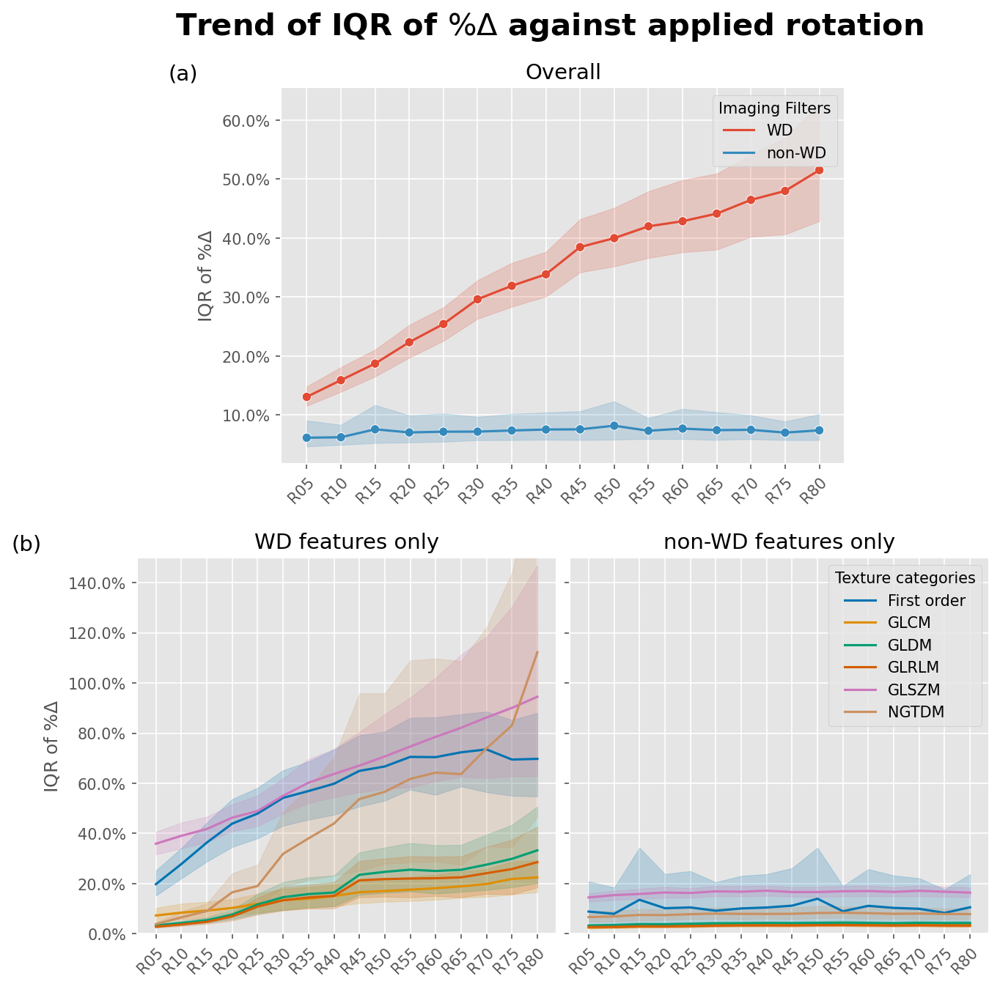

In [14]:
mos = """
      .AAAA.
      BBBCCC
      """
fig, ax_dict = plt.subplot_mosaic(mos, figsize=(10, 10), dpi=150, gridspec_kw={'hspace': 0.25, 'wspace': 0.1})
ax = ax_dict['A']
sns.lineplot(summary_df_p['IQR'].to_frame(), x='Rotation', y='IQR', hue='is_wavelet', hue_order=[True, False], ax=ax)
# print(summary_df_p['IQR'].to_frame().groupby(['Rotation', 'is_wavelet']).mean())
sns.scatterplot(summary_df_p['IQR'].to_frame().groupby(['Rotation', 'is_wavelet']).mean().reset_index(), 
                y='IQR', x='Rotation', hue='is_wavelet', ax=ax, legend=False, hue_order=[True, False])
ax.set_ylabel("IQR of $\%\Delta$")
l = ax.legend()
l.get_texts()[0].set_text("WD")
l.get_texts()[1].set_text("non-WD")
l.set_title('Imaging Filters')
ax.set_title("Overall", fontsize=14)
ax.set_xlabel("")
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right',rotation_mode='anchor')
ax.set_yticklabels([f"{eval(l.get_text()) * 100:.01f}%" for l in ax.get_yticklabels()])
ax.text(-0.2, 1.02, '(a)', transform=ax.transAxes, fontsize=14)

# * Plot stratified by texture categories for WD
axb = ax_dict['B']
sns.lineplot(summary_df_p['IQR'].swaplevel(0, -1).loc[True].to_frame(), x='Rotation', y='IQR', hue='Category', ax=axb,palette='colorblind')
axb.set_title("WD features only", fontsize=14)
axb.set_ylim(0, 1.5)
axb.set_xticklabels(axb.get_xticklabels(), rotation=45, ha='right', rotation_mode='anchor')
axb.set_yticklabels([f"{float(l.get_text().replace('−', '-')) * 100:.01f}%" for l in axb.get_yticklabels()])
axb.set_ylabel("IQR of $\%\Delta$")
axb.set_xlabel("")
axb.text(-0.3, 1.02, '(b)', transform=axb.transAxes, fontsize=14)

l2 = axb.legend()
l2.remove()

# * Plot stratified by texture categories for nWD
axc = ax_dict['C']
sns.lineplot(summary_df_p['IQR'].swaplevel(0, -1).loc[False].to_frame(), x='Rotation', y='IQR', hue='Category', ax=axc, palette='colorblind')
axc.set_title("non-WD features only", fontsize=14)
axc.set_xticklabels(axc.get_xticklabels(), rotation=45, ha='right', rotation_mode='anchor')
axc.set_yticklabels([''] * len(axc.get_yticklabels()))
axc.set_ylabel("")
axc.set_xlabel("")
axc.set_ylim(0, 1.5) # Align with WD
l2 = axc.legend()
for t in l2.get_texts():
    if t.get_text() == 'firstorder':
        t.set_text("First order")
    else:
        t.set_text(t.get_text().upper())
l2.set_title('Texture categories')

fig.suptitle("Trend of IQR of $\%\Delta$ against applied rotation", fontsize=20, fontweight='bold', y=0.95)
# fig.supxlabel("Rotation", fontsize=14)
# fig.tight_layout()
fig.savefig('Figure_3.svg', bbox_inches='tight')